# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████████████| 60.0K/60.0K [02:30<00:00, 494File/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

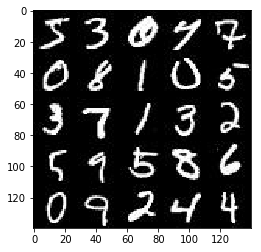

In [135]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

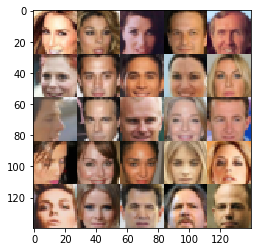

In [136]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [137]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


C:\Users\Isaias\Anaconda3\envs\tflearn\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [156]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real    = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z       = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')
    
    return input_real, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Leaky ReLU
Implement a reusable leaky relu function to below steps

In [157]:
def leaky_relu(x, alpha=0.2, name='leaky_relu'): 
    return tf.maximum(x, alpha * x, name=name)

### Generator and Discriminator Dropout Function
Implement a dropout function to use below

In [158]:
def gdropout(x, training):
#    rate = 0.1
#    kprob = 1 - rate
    return tf.layers.dropout(x, rate=0.1, training=training)

def ddropout(x):
    return tf.layers.dropout(x, rate=0.1)

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [159]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    # From discriminator_solution
    kernet_init = tf.contrib.layers.xavier_initializer()
    with tf.variable_scope('discriminator',reuse=reuse):

        x1 = tf.layers.conv2d(images, 64, 5, strides=2, kernel_initializer=kernet_init, padding='same')
        x1 = leaky_relu(x1)

        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, kernel_initializer=kernet_init, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = leaky_relu(x2)
        x2 = ddropout(x2)

        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, kernel_initializer=kernet_init, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x2 = leaky_relu(x3)
        x3 = ddropout(x2)

        #flattern
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out    = tf.sigmoid(logits)
    return out, logits
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [160]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    kernet_init = tf.contrib.layers.xavier_initializer()
    with tf.variable_scope('generator', reuse=(not is_train)):
        # first full connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        #reshape
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = leaky_relu(x1)

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, kernel_initializer=kernet_init, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = leaky_relu(x2)
        x2 = gdropout(x2, training=is_train)

        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, kernel_initializer=kernet_init, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = leaky_relu(x3)
        x2 = gdropout(x3, training=is_train)

        #output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=1, kernel_initializer=kernet_init, padding='same')
        #28x28x3
        out = tf.tanh(logits)
    return out        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [161]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    s = 0.1 #smooth
    gout = generator(input_z, out_channel_dim)
    dout_real, dlogit_real = discriminator(input_real)
    dout_fake, dlogit_fake = discriminator(gout, reuse=True)
    dreal = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dlogit_real, labels=tf.ones_like(dout_real)*(1-s)))
    dfake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dlogit_fake, labels=tf.zeros_like(dout_fake)))
    gloss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dlogit_fake, labels=tf.ones_like(dout_fake)))
    dloss = dreal + dfake
    return dloss, gloss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [162]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    tvars  = tf.trainable_variables()
    gvars  = [var for var in tvars if var.name.startswith('generator')]
    dvars  = [var for var in tvars if var.name.startswith('discriminator')]
    update = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(update):
        gtrainopt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=gvars)
        dtrainopt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=dvars)
    return dtrainopt, gtrainopt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [163]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [164]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, w, h, ch = data_shape
    input_real, input_z, learningrate = model_inputs(w, h, ch, z_dim)
    dloss, gloss = model_loss(input_real, input_z, ch)
    dtrainopt, gtrainopt = model_opt(dloss, gloss, learningrate, beta1)
    cnt = 0
    losses = []
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                cnt = cnt + 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(dtrainopt, feed_dict={input_real: batch_images, input_z: batch_z, learningrate: learning_rate})
                _ = sess.run(gtrainopt, feed_dict={input_real: batch_images, input_z: batch_z, learningrate:learning_rate})

                if cnt % 25 == 0:
                    show_generator_output(sess, 16, input_z, ch, data_image_mode)
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = dloss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = gloss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                            "Generator Loss: {:.4f}".format(train_loss_g),
                            "Discriminator Loss: {:.4f}...".format(train_loss_d))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if cnt % 100 == 0:
                    show_generator_output(sess, 16, input_z, ch, data_image_mode)
        saver.save(sess, './gout.ckpt')
    return None

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

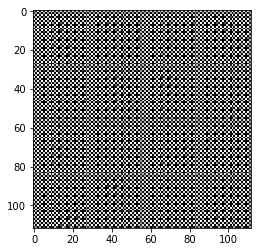

Epoch 1/2... Generator Loss: 11.7365 Discriminator Loss: 0.3364...


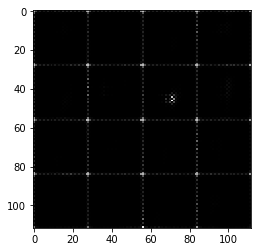

Epoch 1/2... Generator Loss: 1.4751 Discriminator Loss: 0.8204...


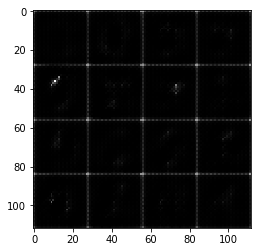

Epoch 1/2... Generator Loss: 1.1750 Discriminator Loss: 1.7368...


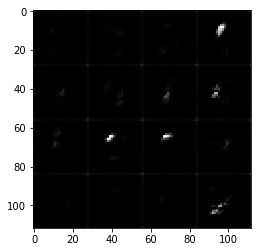

Epoch 1/2... Generator Loss: 2.3395 Discriminator Loss: 1.7166...


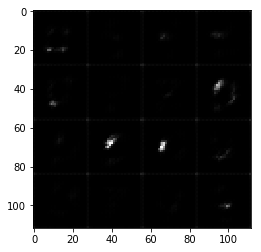

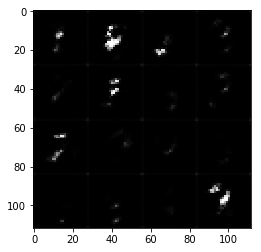

Epoch 1/2... Generator Loss: 1.4611 Discriminator Loss: 1.3804...


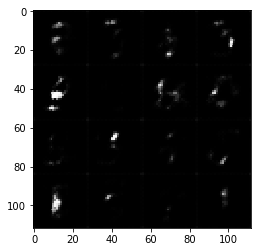

Epoch 1/2... Generator Loss: 1.8190 Discriminator Loss: 1.3931...


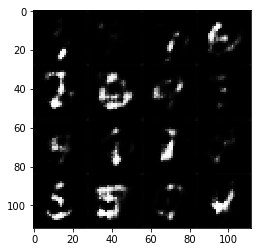

Epoch 1/2... Generator Loss: 0.6806 Discriminator Loss: 1.2013...


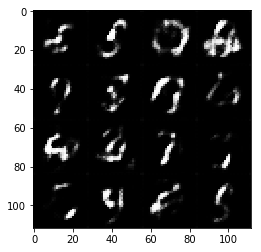

Epoch 1/2... Generator Loss: 1.2902 Discriminator Loss: 1.1288...


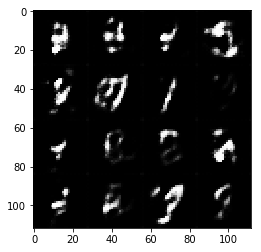

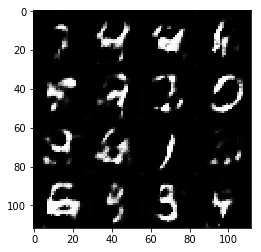

Epoch 1/2... Generator Loss: 0.6278 Discriminator Loss: 1.2668...


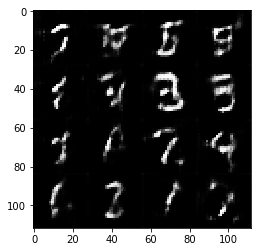

Epoch 1/2... Generator Loss: 0.5630 Discriminator Loss: 1.4138...


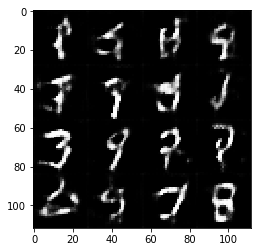

Epoch 1/2... Generator Loss: 0.9363 Discriminator Loss: 1.4024...


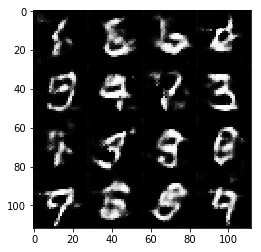

Epoch 1/2... Generator Loss: 1.1381 Discriminator Loss: 1.2560...


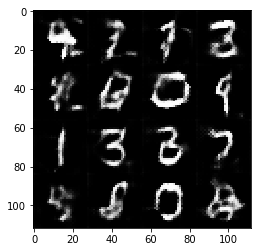

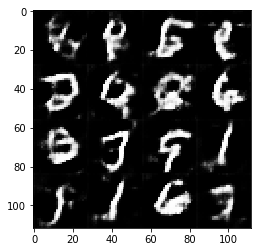

Epoch 1/2... Generator Loss: 1.2397 Discriminator Loss: 1.2642...


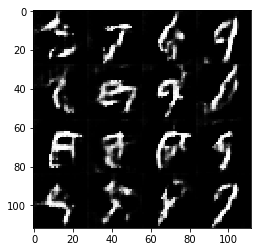

Epoch 1/2... Generator Loss: 0.7393 Discriminator Loss: 1.2538...


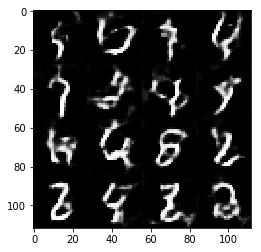

Epoch 1/2... Generator Loss: 0.2111 Discriminator Loss: 2.1433...


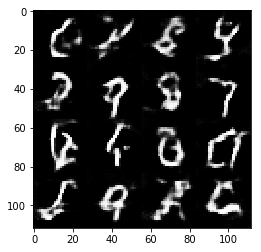

Epoch 1/2... Generator Loss: 0.4374 Discriminator Loss: 1.5767...


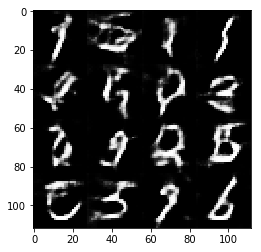

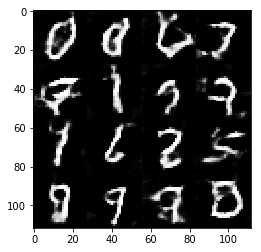

Epoch 1/2... Generator Loss: 1.2873 Discriminator Loss: 1.3371...


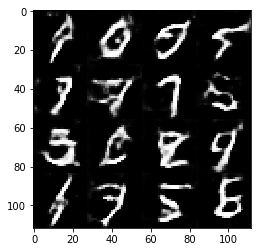

Epoch 1/2... Generator Loss: 1.1858 Discriminator Loss: 1.2433...


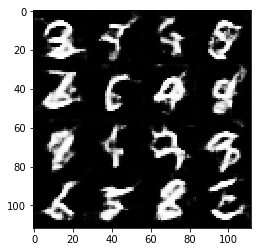

Epoch 1/2... Generator Loss: 0.6995 Discriminator Loss: 1.4073...


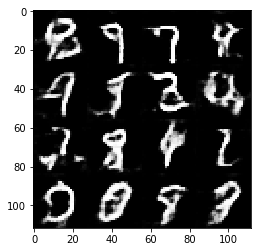

Epoch 1/2... Generator Loss: 0.8439 Discriminator Loss: 1.2301...


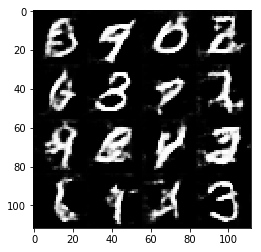

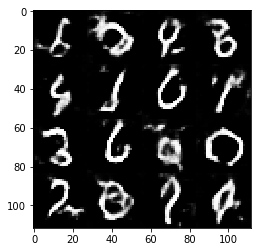

Epoch 1/2... Generator Loss: 0.5063 Discriminator Loss: 1.4264...


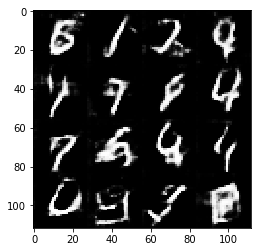

Epoch 1/2... Generator Loss: 0.8413 Discriminator Loss: 1.3521...


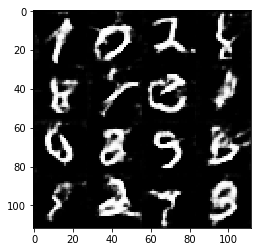

Epoch 1/2... Generator Loss: 0.7254 Discriminator Loss: 1.3018...


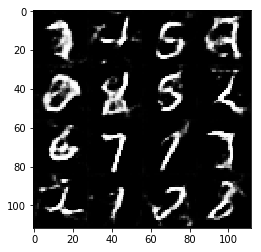

Epoch 1/2... Generator Loss: 0.6382 Discriminator Loss: 1.3161...


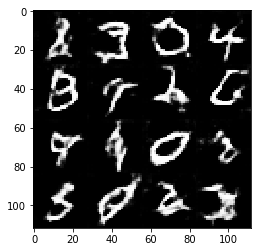

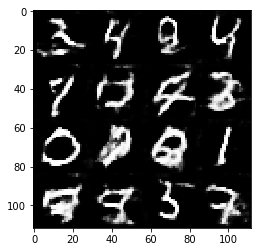

Epoch 1/2... Generator Loss: 0.4857 Discriminator Loss: 1.4799...


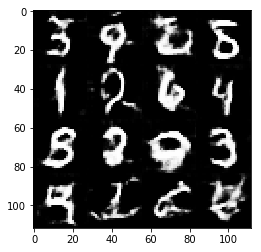

Epoch 1/2... Generator Loss: 0.5541 Discriminator Loss: 1.3408...


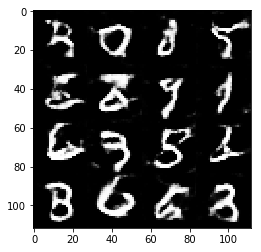

Epoch 1/2... Generator Loss: 1.4787 Discriminator Loss: 1.3079...


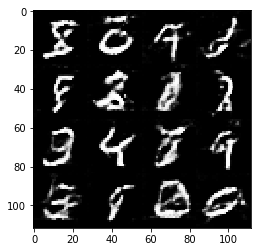

Epoch 1/2... Generator Loss: 0.6675 Discriminator Loss: 1.3760...


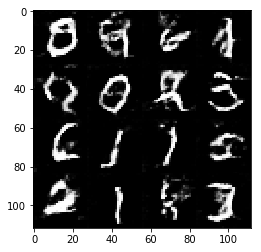

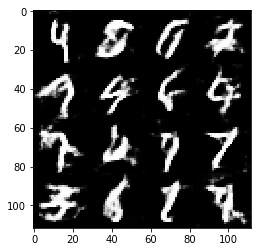

Epoch 1/2... Generator Loss: 1.5137 Discriminator Loss: 1.3964...


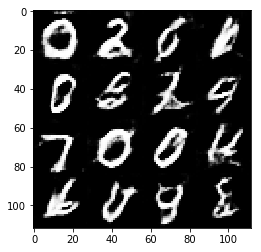

Epoch 1/2... Generator Loss: 0.3477 Discriminator Loss: 1.6813...


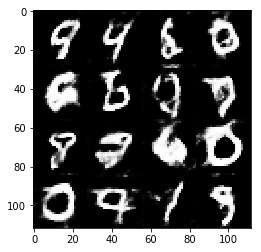

Epoch 1/2... Generator Loss: 0.6403 Discriminator Loss: 1.2759...


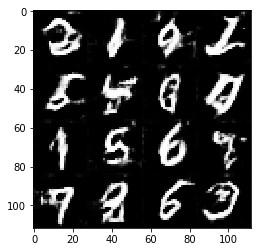

Epoch 1/2... Generator Loss: 0.6400 Discriminator Loss: 1.3162...


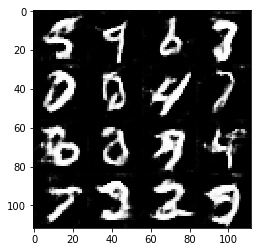

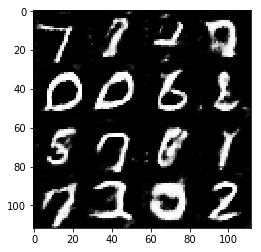

Epoch 1/2... Generator Loss: 1.2641 Discriminator Loss: 1.0975...


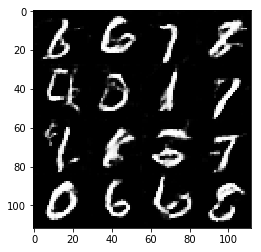

Epoch 1/2... Generator Loss: 1.1760 Discriminator Loss: 1.1115...


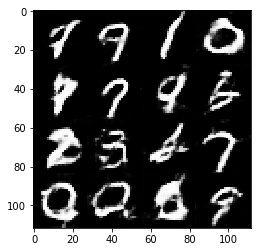

Epoch 1/2... Generator Loss: 1.2380 Discriminator Loss: 1.1542...


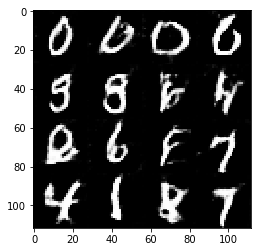

Epoch 1/2... Generator Loss: 1.8157 Discriminator Loss: 1.3798...


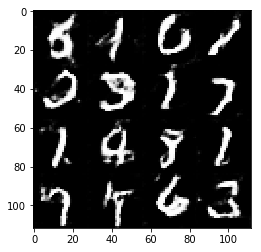

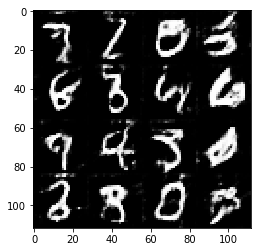

Epoch 1/2... Generator Loss: 1.3255 Discriminator Loss: 1.0945...


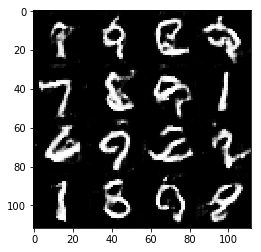

Epoch 2/2... Generator Loss: 1.2730 Discriminator Loss: 1.0392...


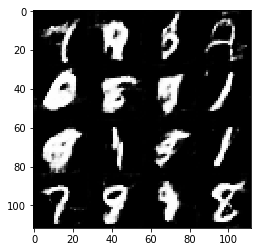

Epoch 2/2... Generator Loss: 0.2034 Discriminator Loss: 2.1850...


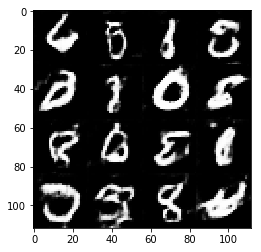

Epoch 2/2... Generator Loss: 1.1995 Discriminator Loss: 1.2518...


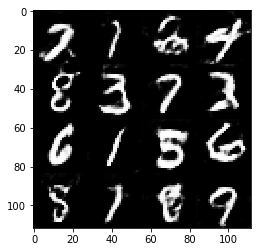

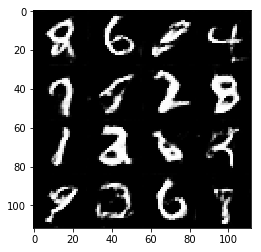

Epoch 2/2... Generator Loss: 1.3987 Discriminator Loss: 1.2253...


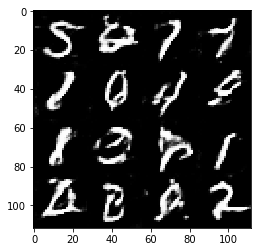

Epoch 2/2... Generator Loss: 1.2612 Discriminator Loss: 1.1098...


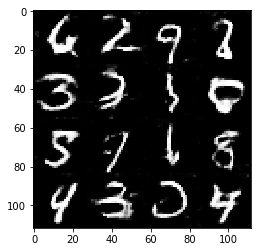

Epoch 2/2... Generator Loss: 1.2594 Discriminator Loss: 1.1855...


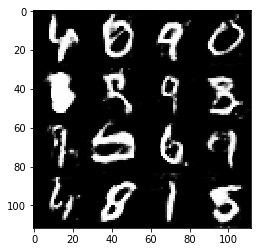

Epoch 2/2... Generator Loss: 0.4172 Discriminator Loss: 1.5802...


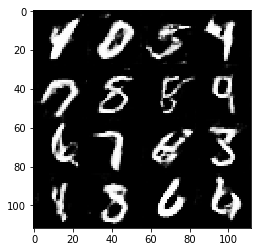

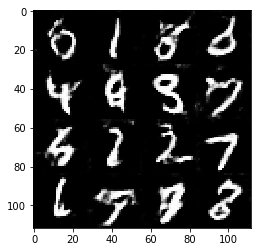

Epoch 2/2... Generator Loss: 1.2536 Discriminator Loss: 1.0939...


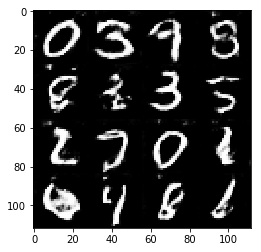

Epoch 2/2... Generator Loss: 0.6812 Discriminator Loss: 1.2312...


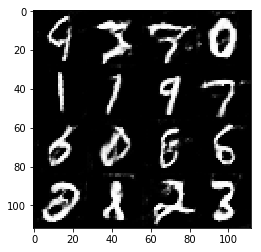

Epoch 2/2... Generator Loss: 0.8232 Discriminator Loss: 1.0805...


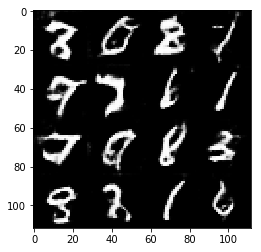

Epoch 2/2... Generator Loss: 0.5763 Discriminator Loss: 1.3569...


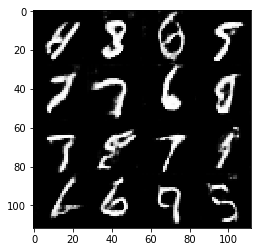

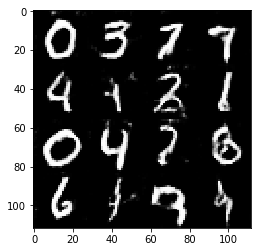

Epoch 2/2... Generator Loss: 1.0301 Discriminator Loss: 1.1632...


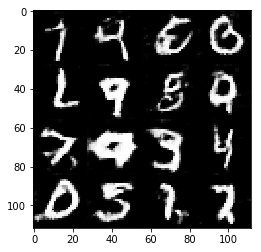

Epoch 2/2... Generator Loss: 0.9832 Discriminator Loss: 1.1791...


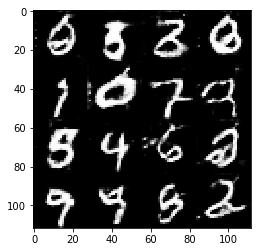

Epoch 2/2... Generator Loss: 0.9203 Discriminator Loss: 1.1228...


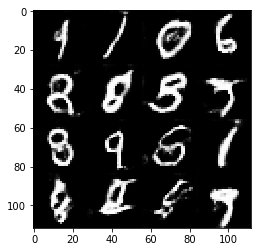

Epoch 2/2... Generator Loss: 1.2660 Discriminator Loss: 1.2281...


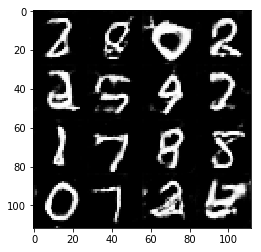

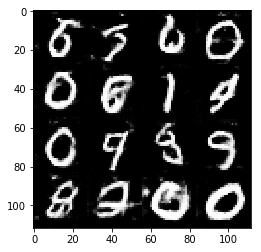

Epoch 2/2... Generator Loss: 0.9396 Discriminator Loss: 1.1941...


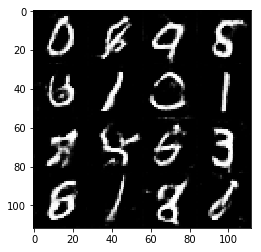

Epoch 2/2... Generator Loss: 0.9573 Discriminator Loss: 1.2728...


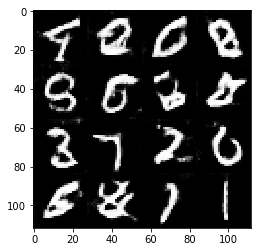

Epoch 2/2... Generator Loss: 1.1038 Discriminator Loss: 0.9547...


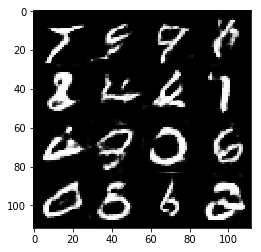

Epoch 2/2... Generator Loss: 1.7715 Discriminator Loss: 1.3187...


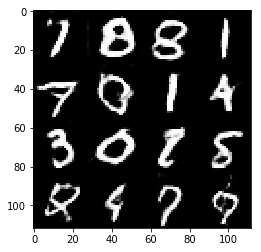

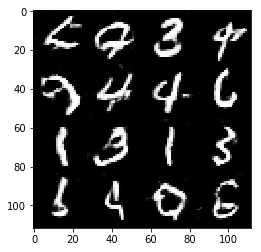

Epoch 2/2... Generator Loss: 0.5977 Discriminator Loss: 1.3178...


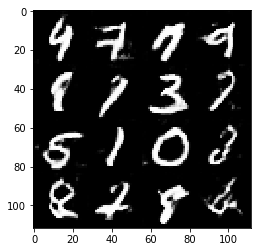

Epoch 2/2... Generator Loss: 1.6819 Discriminator Loss: 1.5989...


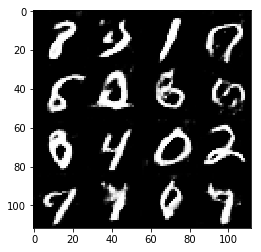

Epoch 2/2... Generator Loss: 1.7607 Discriminator Loss: 1.2043...


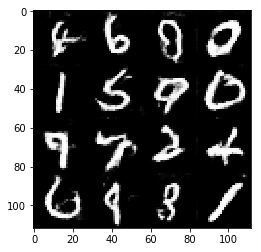

Epoch 2/2... Generator Loss: 0.7067 Discriminator Loss: 1.2016...


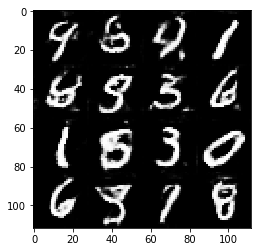

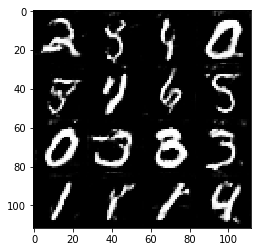

Epoch 2/2... Generator Loss: 0.8879 Discriminator Loss: 1.0579...


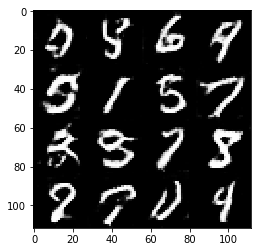

Epoch 2/2... Generator Loss: 0.9831 Discriminator Loss: 1.0013...


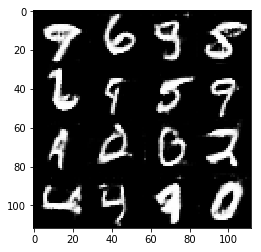

Epoch 2/2... Generator Loss: 1.2495 Discriminator Loss: 1.0618...


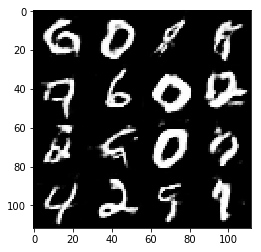

Epoch 2/2... Generator Loss: 0.8757 Discriminator Loss: 1.2072...


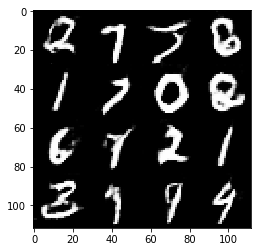

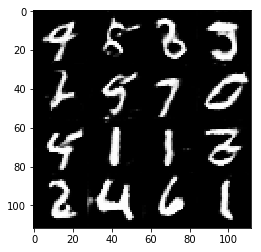

Epoch 2/2... Generator Loss: 0.7665 Discriminator Loss: 1.1226...


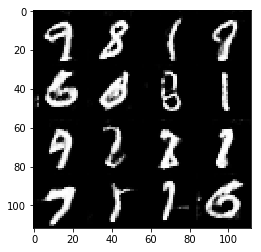

Epoch 2/2... Generator Loss: 0.6637 Discriminator Loss: 1.2413...


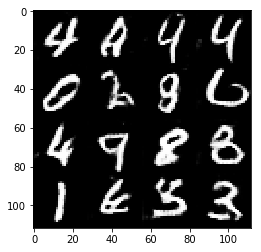

Epoch 2/2... Generator Loss: 1.1209 Discriminator Loss: 1.0862...


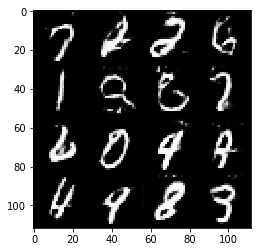

Epoch 2/2... Generator Loss: 0.6356 Discriminator Loss: 1.2308...


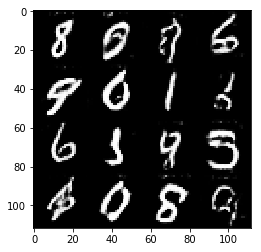

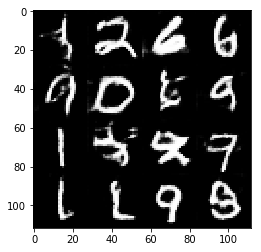

Epoch 2/2... Generator Loss: 0.7636 Discriminator Loss: 1.1912...


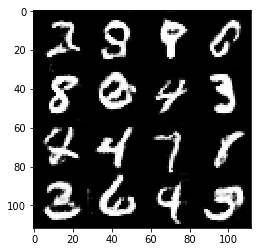

Epoch 2/2... Generator Loss: 2.4403 Discriminator Loss: 1.2581...


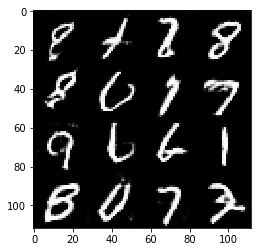

Epoch 2/2... Generator Loss: 0.8163 Discriminator Loss: 1.0861...


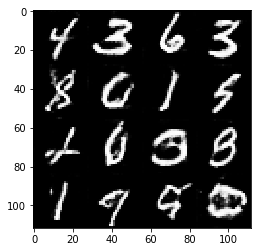

Epoch 2/2... Generator Loss: 0.9317 Discriminator Loss: 1.2277...


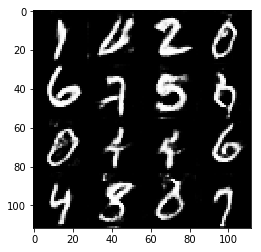

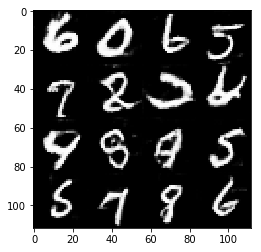

Epoch 2/2... Generator Loss: 1.1973 Discriminator Loss: 1.1447...


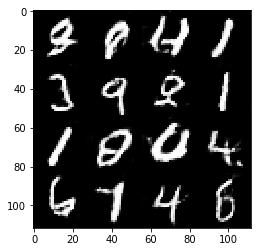

Epoch 2/2... Generator Loss: 0.6775 Discriminator Loss: 1.2360...


In [165]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.3
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

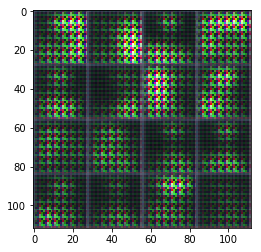

Epoch 1/1... Generator Loss: 0.4921 Discriminator Loss: 2.5700...


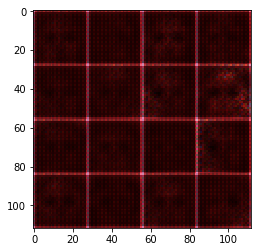

Epoch 1/1... Generator Loss: 0.3847 Discriminator Loss: 1.8485...


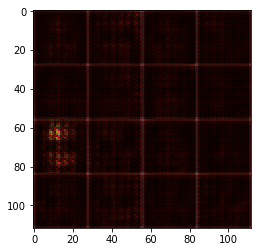

Epoch 1/1... Generator Loss: 2.0450 Discriminator Loss: 0.6791...


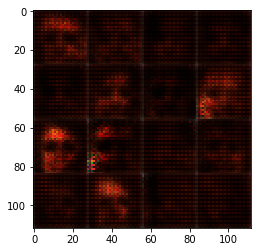

Epoch 1/1... Generator Loss: 2.9243 Discriminator Loss: 1.1461...


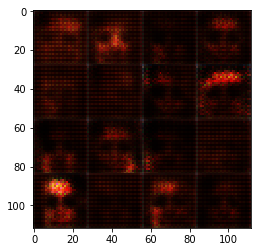

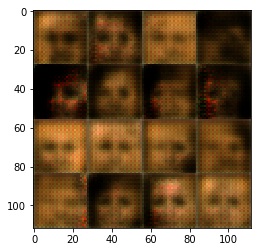

Epoch 1/1... Generator Loss: 0.4081 Discriminator Loss: 1.5906...


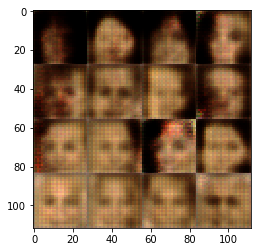

Epoch 1/1... Generator Loss: 0.8599 Discriminator Loss: 1.2501...


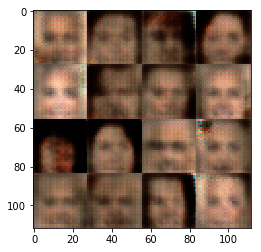

Epoch 1/1... Generator Loss: 1.4496 Discriminator Loss: 1.4786...


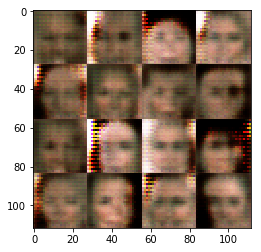

Epoch 1/1... Generator Loss: 1.7438 Discriminator Loss: 1.1786...


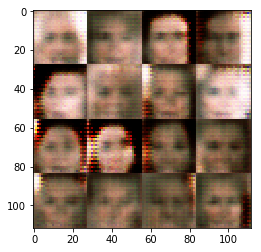

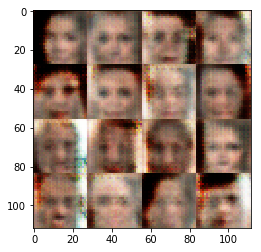

Epoch 1/1... Generator Loss: 1.2932 Discriminator Loss: 1.7125...


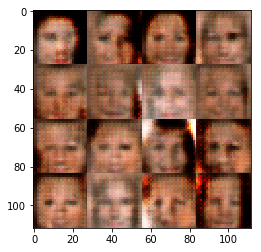

Epoch 1/1... Generator Loss: 1.6808 Discriminator Loss: 2.0918...


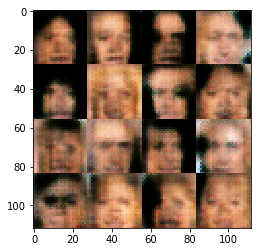

Epoch 1/1... Generator Loss: 0.2870 Discriminator Loss: 1.8252...


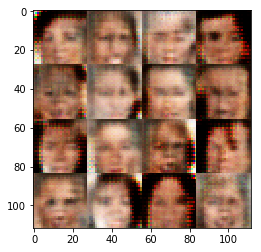

Epoch 1/1... Generator Loss: 1.8974 Discriminator Loss: 1.2958...


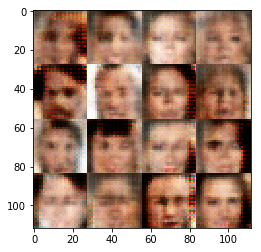

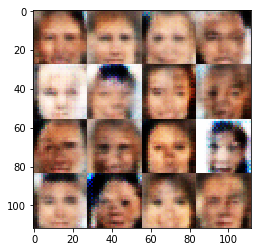

Epoch 1/1... Generator Loss: 0.8460 Discriminator Loss: 1.4018...


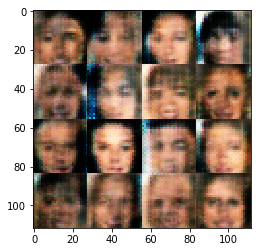

Epoch 1/1... Generator Loss: 0.8690 Discriminator Loss: 1.3620...


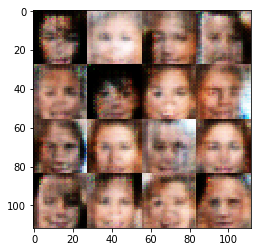

Epoch 1/1... Generator Loss: 0.8697 Discriminator Loss: 1.3521...


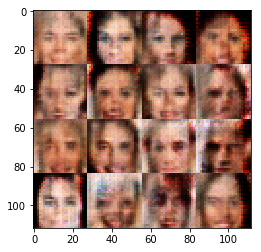

Epoch 1/1... Generator Loss: 0.7502 Discriminator Loss: 1.4596...


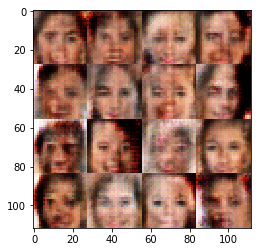

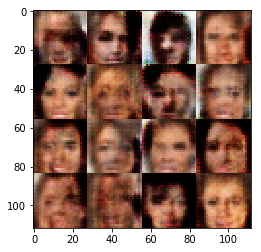

Epoch 1/1... Generator Loss: 0.9773 Discriminator Loss: 1.2610...


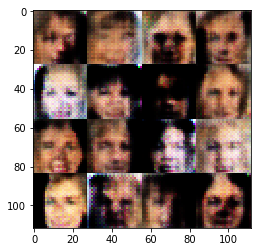

Epoch 1/1... Generator Loss: 0.6651 Discriminator Loss: 1.7693...


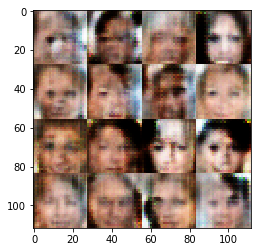

Epoch 1/1... Generator Loss: 0.9717 Discriminator Loss: 1.2687...


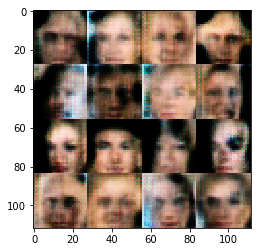

Epoch 1/1... Generator Loss: 0.0388 Discriminator Loss: 3.8707...


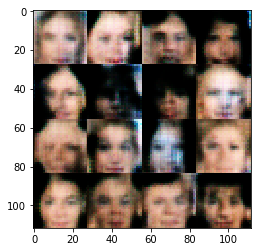

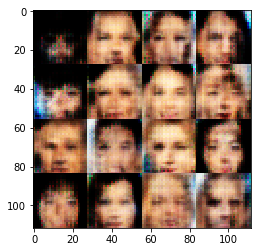

Epoch 1/1... Generator Loss: 0.8133 Discriminator Loss: 1.2906...


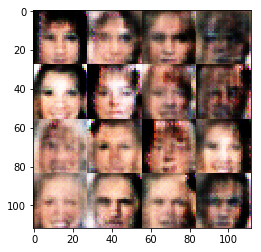

Epoch 1/1... Generator Loss: 0.7798 Discriminator Loss: 1.3197...


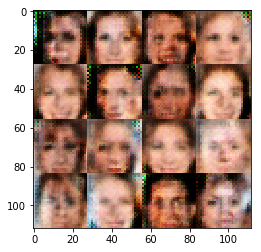

Epoch 1/1... Generator Loss: 0.6358 Discriminator Loss: 1.3891...


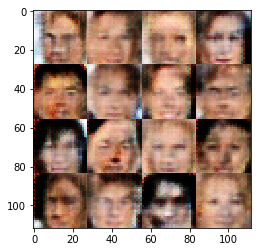

Epoch 1/1... Generator Loss: 0.7372 Discriminator Loss: 1.4120...


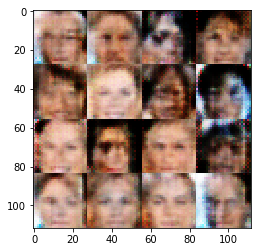

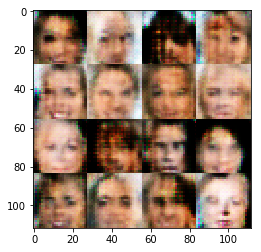

Epoch 1/1... Generator Loss: 0.7145 Discriminator Loss: 1.1891...


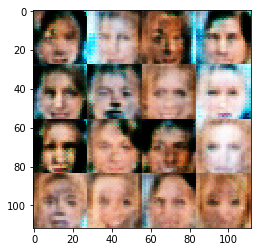

Epoch 1/1... Generator Loss: 0.9800 Discriminator Loss: 1.2960...


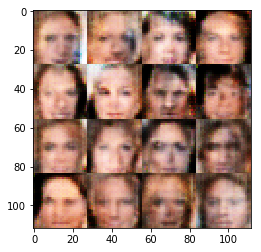

Epoch 1/1... Generator Loss: 0.7824 Discriminator Loss: 1.2428...


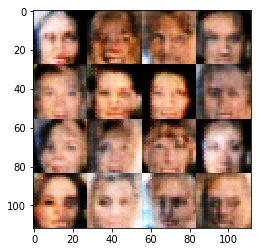

Epoch 1/1... Generator Loss: 0.5434 Discriminator Loss: 1.4026...


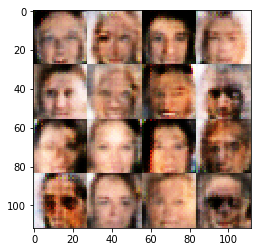

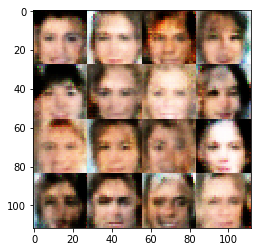

Epoch 1/1... Generator Loss: 1.1035 Discriminator Loss: 1.3522...


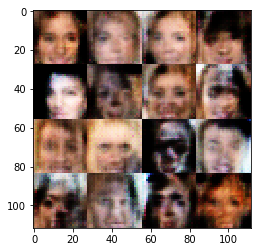

Epoch 1/1... Generator Loss: 1.3240 Discriminator Loss: 1.6951...


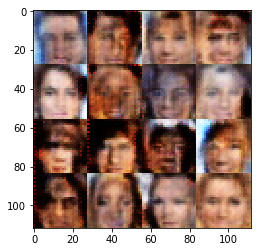

Epoch 1/1... Generator Loss: 1.7504 Discriminator Loss: 1.8702...


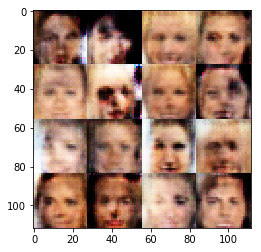

Epoch 1/1... Generator Loss: 0.6256 Discriminator Loss: 1.4014...


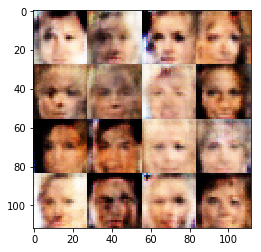

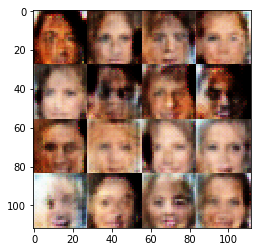

Epoch 1/1... Generator Loss: 1.0486 Discriminator Loss: 1.1141...


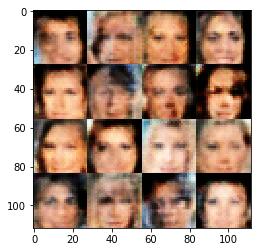

Epoch 1/1... Generator Loss: 0.8080 Discriminator Loss: 1.3052...


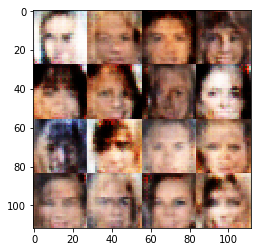

Epoch 1/1... Generator Loss: 0.7172 Discriminator Loss: 1.3739...


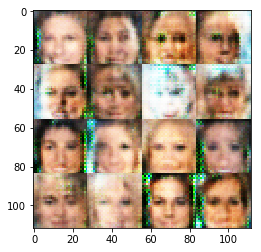

Epoch 1/1... Generator Loss: 0.6719 Discriminator Loss: 1.3470...


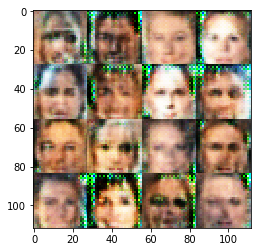

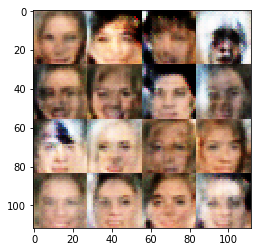

Epoch 1/1... Generator Loss: 0.6775 Discriminator Loss: 1.4502...


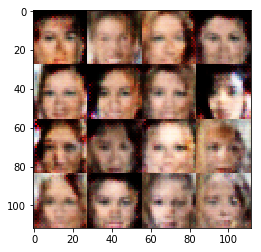

Epoch 1/1... Generator Loss: 0.9164 Discriminator Loss: 1.1948...


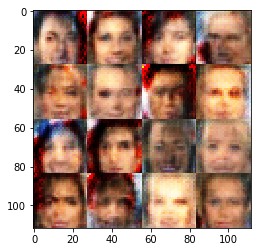

Epoch 1/1... Generator Loss: 0.7508 Discriminator Loss: 1.3436...


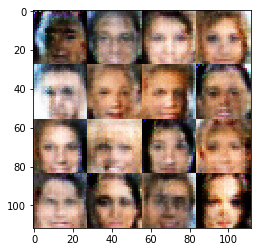

Epoch 1/1... Generator Loss: 0.7421 Discriminator Loss: 1.3945...


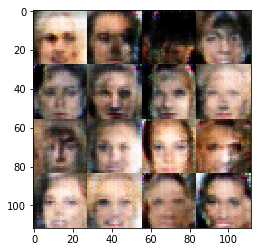

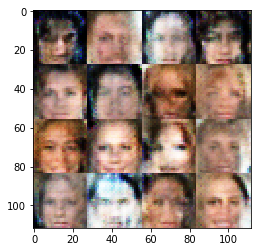

Epoch 1/1... Generator Loss: 0.7706 Discriminator Loss: 1.4269...


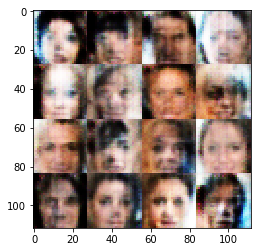

Epoch 1/1... Generator Loss: 0.8389 Discriminator Loss: 1.2974...


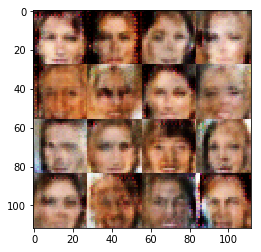

Epoch 1/1... Generator Loss: 0.9235 Discriminator Loss: 1.4303...


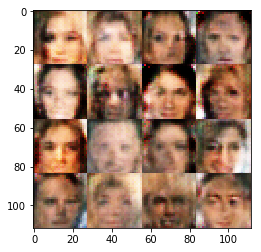

Epoch 1/1... Generator Loss: 0.9958 Discriminator Loss: 1.2380...


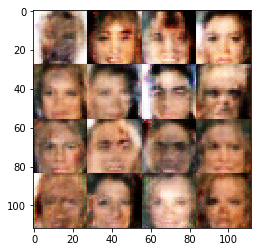

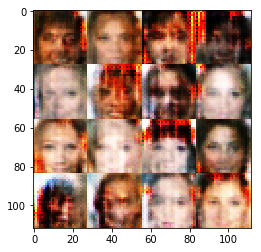

Epoch 1/1... Generator Loss: 1.0274 Discriminator Loss: 1.0277...


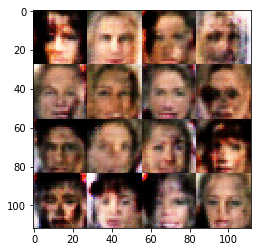

Epoch 1/1... Generator Loss: 0.8032 Discriminator Loss: 1.4447...


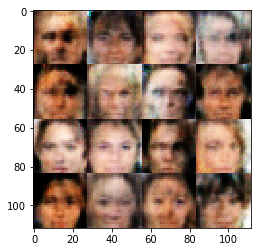

Epoch 1/1... Generator Loss: 0.5518 Discriminator Loss: 1.4178...


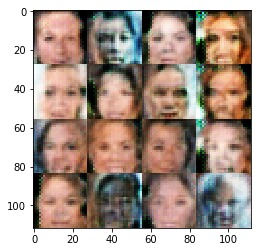

Epoch 1/1... Generator Loss: 1.2021 Discriminator Loss: 1.3334...


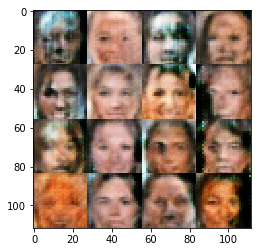

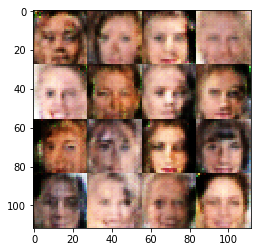

Epoch 1/1... Generator Loss: 0.5166 Discriminator Loss: 1.4791...


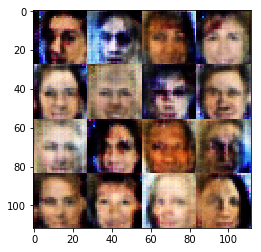

Epoch 1/1... Generator Loss: 0.7607 Discriminator Loss: 1.3713...


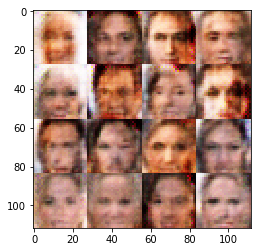

Epoch 1/1... Generator Loss: 0.9885 Discriminator Loss: 1.1599...


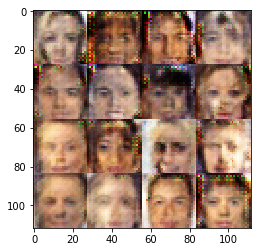

Epoch 1/1... Generator Loss: 0.7461 Discriminator Loss: 1.4458...


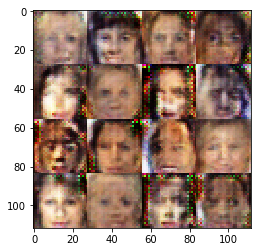

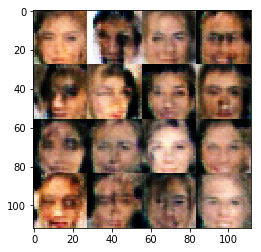

Epoch 1/1... Generator Loss: 0.7344 Discriminator Loss: 1.3566...


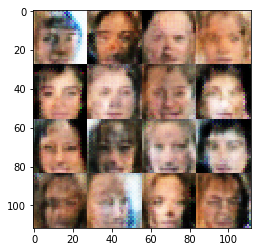

Epoch 1/1... Generator Loss: 1.3597 Discriminator Loss: 1.4788...


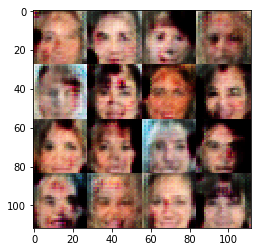

Epoch 1/1... Generator Loss: 0.9013 Discriminator Loss: 1.3140...


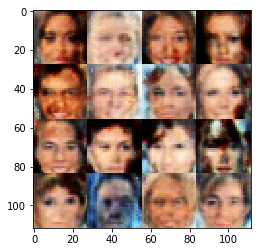

Epoch 1/1... Generator Loss: 0.3734 Discriminator Loss: 1.6193...


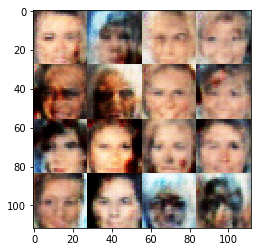

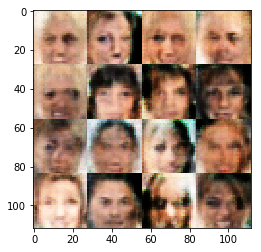

Epoch 1/1... Generator Loss: 0.8651 Discriminator Loss: 1.2488...


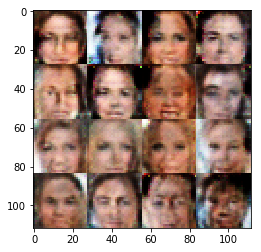

Epoch 1/1... Generator Loss: 0.3704 Discriminator Loss: 1.6581...


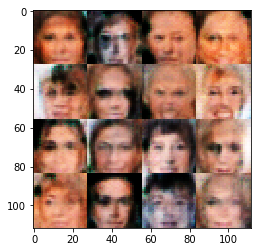

Epoch 1/1... Generator Loss: 0.6007 Discriminator Loss: 1.3770...


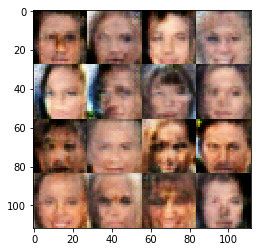

Epoch 1/1... Generator Loss: 0.8088 Discriminator Loss: 1.3540...


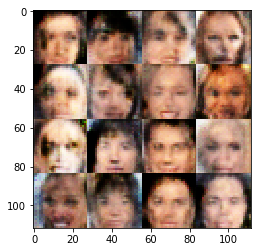

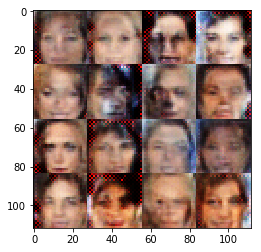

Epoch 1/1... Generator Loss: 1.4802 Discriminator Loss: 1.0917...


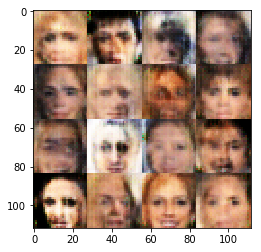

Epoch 1/1... Generator Loss: 0.7012 Discriminator Loss: 1.4072...


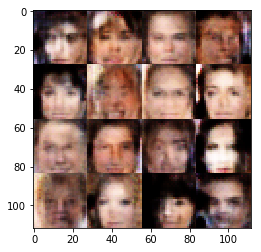

Epoch 1/1... Generator Loss: 1.5401 Discriminator Loss: 1.6702...


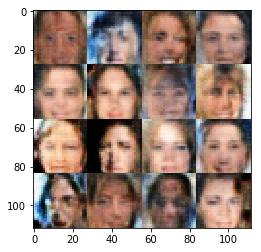

Epoch 1/1... Generator Loss: 1.4818 Discriminator Loss: 1.5811...


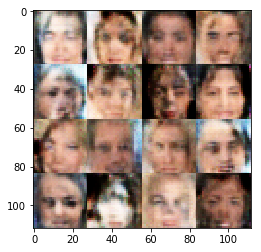

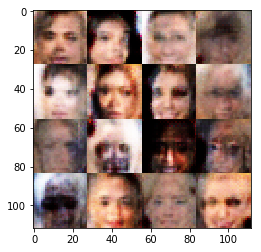

Epoch 1/1... Generator Loss: 1.6587 Discriminator Loss: 1.8017...


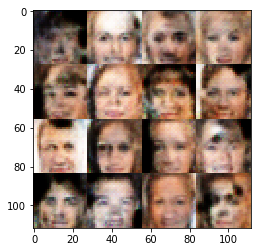

Epoch 1/1... Generator Loss: 0.7810 Discriminator Loss: 1.2791...


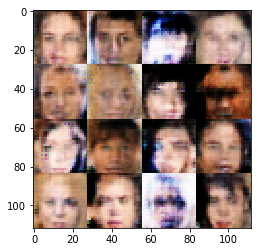

Epoch 1/1... Generator Loss: 1.0060 Discriminator Loss: 1.3135...


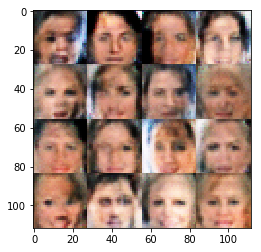

Epoch 1/1... Generator Loss: 1.0336 Discriminator Loss: 1.3612...


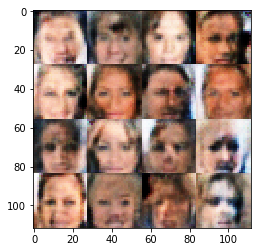

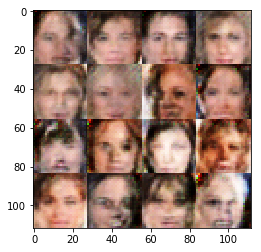

Epoch 1/1... Generator Loss: 0.7881 Discriminator Loss: 1.3857...


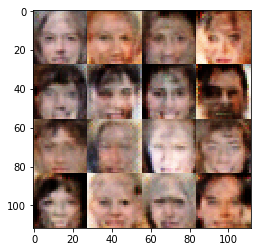

Epoch 1/1... Generator Loss: 0.9086 Discriminator Loss: 1.3974...


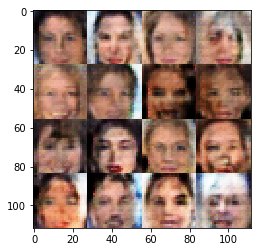

Epoch 1/1... Generator Loss: 0.6246 Discriminator Loss: 1.4550...


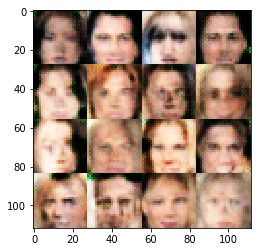

Epoch 1/1... Generator Loss: 0.9725 Discriminator Loss: 1.1675...


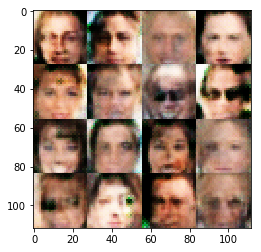

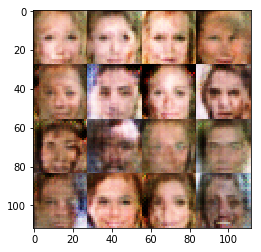

Epoch 1/1... Generator Loss: 0.6934 Discriminator Loss: 1.4252...


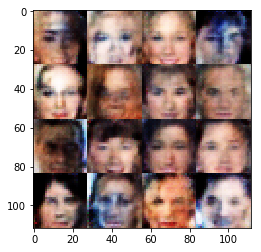

Epoch 1/1... Generator Loss: 1.1166 Discriminator Loss: 1.4636...


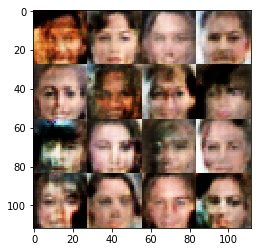

Epoch 1/1... Generator Loss: 0.8304 Discriminator Loss: 1.3480...


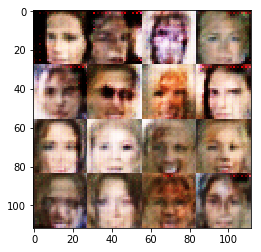

Epoch 1/1... Generator Loss: 0.7030 Discriminator Loss: 1.5624...


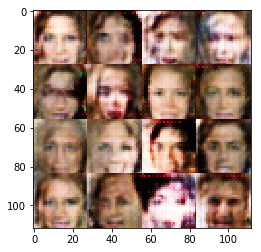

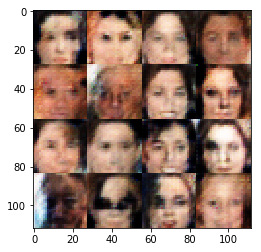

Epoch 1/1... Generator Loss: 0.7401 Discriminator Loss: 1.3546...


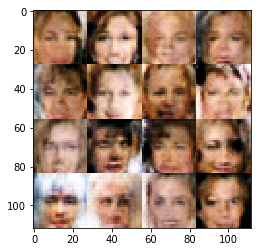

Epoch 1/1... Generator Loss: 0.7041 Discriminator Loss: 1.4199...


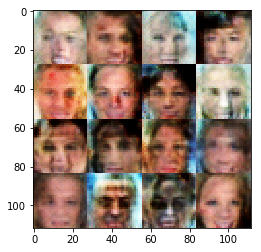

Epoch 1/1... Generator Loss: 0.5310 Discriminator Loss: 1.4813...


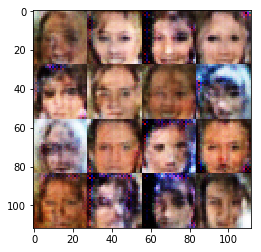

Epoch 1/1... Generator Loss: 0.8847 Discriminator Loss: 1.2216...


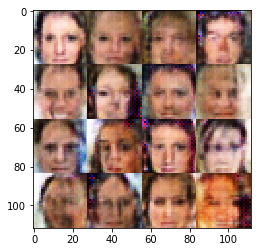

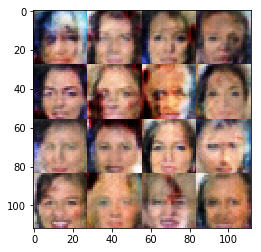

Epoch 1/1... Generator Loss: 0.5978 Discriminator Loss: 1.4548...


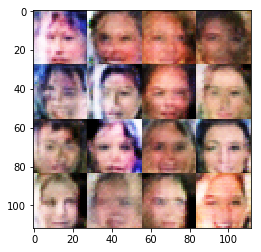

Epoch 1/1... Generator Loss: 0.9460 Discriminator Loss: 1.2356...


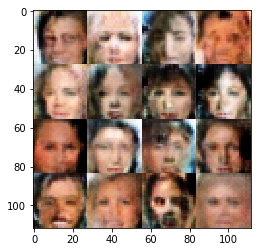

Epoch 1/1... Generator Loss: 0.7249 Discriminator Loss: 1.4068...


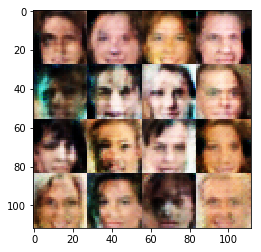

Epoch 1/1... Generator Loss: 0.6744 Discriminator Loss: 1.2840...


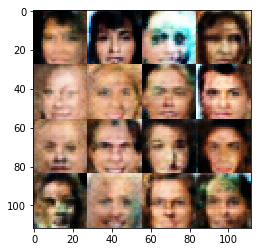

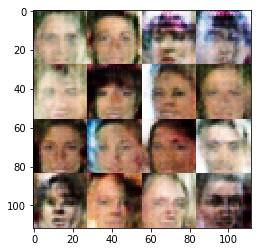

Epoch 1/1... Generator Loss: 0.7322 Discriminator Loss: 1.3722...


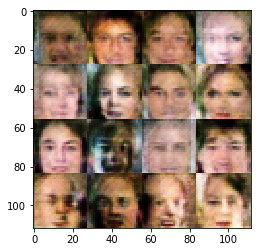

Epoch 1/1... Generator Loss: 1.1625 Discriminator Loss: 1.4487...


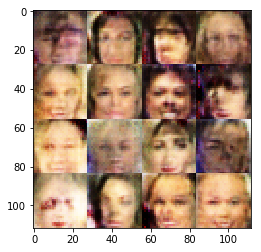

Epoch 1/1... Generator Loss: 0.7580 Discriminator Loss: 1.4490...


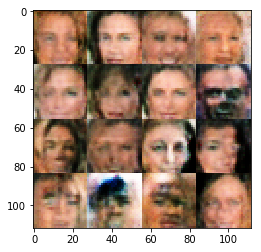

Epoch 1/1... Generator Loss: 0.6891 Discriminator Loss: 1.3657...


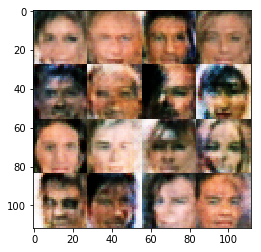

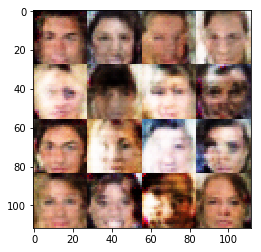

Epoch 1/1... Generator Loss: 0.7848 Discriminator Loss: 1.4016...


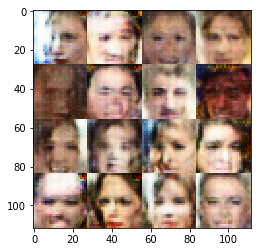

Epoch 1/1... Generator Loss: 0.8141 Discriminator Loss: 1.4356...


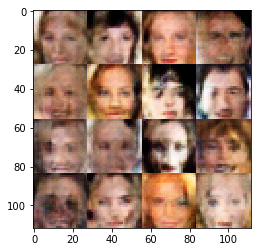

Epoch 1/1... Generator Loss: 0.7435 Discriminator Loss: 1.3587...


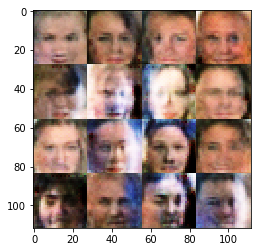

Epoch 1/1... Generator Loss: 0.7824 Discriminator Loss: 1.4444...


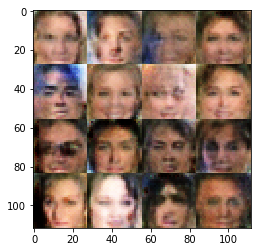

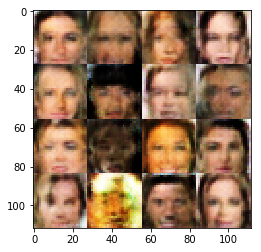

Epoch 1/1... Generator Loss: 0.8239 Discriminator Loss: 1.3695...


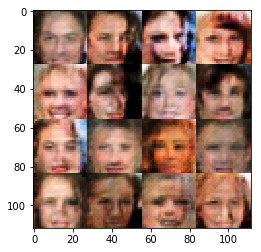

Epoch 1/1... Generator Loss: 0.9381 Discriminator Loss: 1.4920...


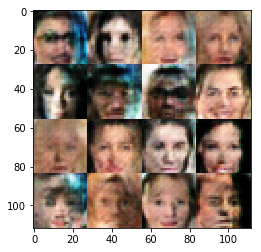

Epoch 1/1... Generator Loss: 0.9427 Discriminator Loss: 1.3900...


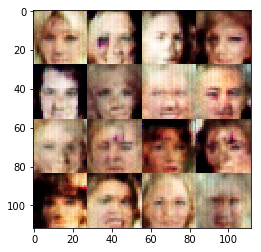

Epoch 1/1... Generator Loss: 0.8394 Discriminator Loss: 1.2677...


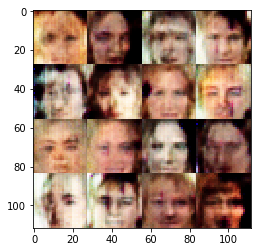

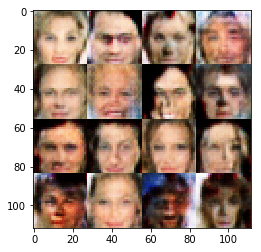

Epoch 1/1... Generator Loss: 0.8227 Discriminator Loss: 1.3185...


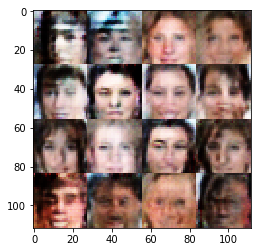

Epoch 1/1... Generator Loss: 1.0196 Discriminator Loss: 1.3976...


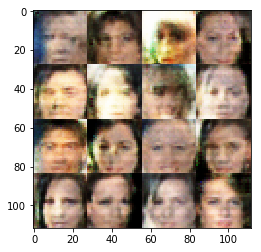

Epoch 1/1... Generator Loss: 0.7400 Discriminator Loss: 1.3596...


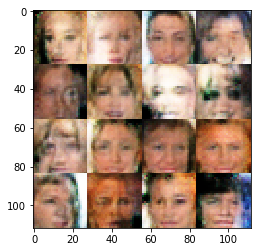

Epoch 1/1... Generator Loss: 0.6824 Discriminator Loss: 1.3934...


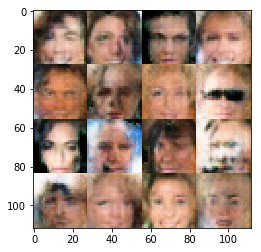

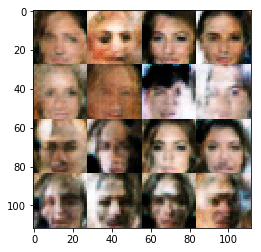

Epoch 1/1... Generator Loss: 0.5237 Discriminator Loss: 1.4790...


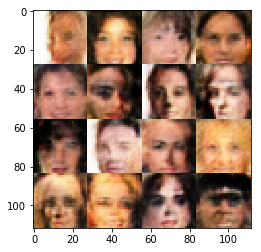

Epoch 1/1... Generator Loss: 0.7327 Discriminator Loss: 1.4498...


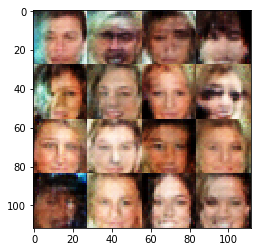

Epoch 1/1... Generator Loss: 0.8632 Discriminator Loss: 1.4068...


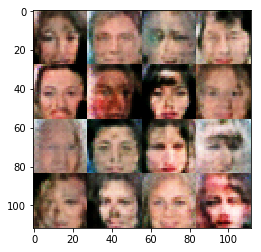

Epoch 1/1... Generator Loss: 0.8160 Discriminator Loss: 1.3062...


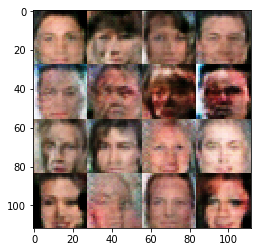

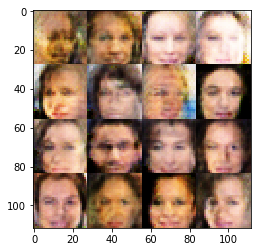

Epoch 1/1... Generator Loss: 0.7780 Discriminator Loss: 1.2636...


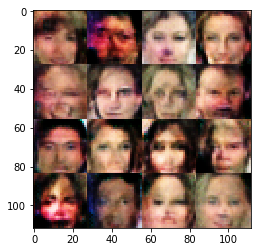

Epoch 1/1... Generator Loss: 0.7244 Discriminator Loss: 1.3253...


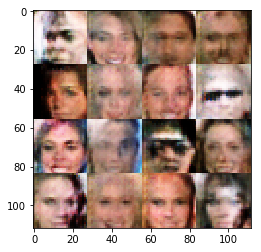

Epoch 1/1... Generator Loss: 0.9452 Discriminator Loss: 1.3594...


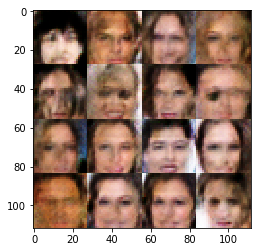

Epoch 1/1... Generator Loss: 0.7335 Discriminator Loss: 1.3821...


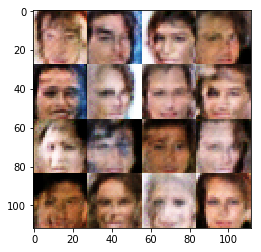

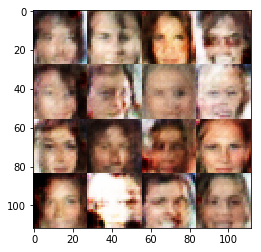

Epoch 1/1... Generator Loss: 0.7076 Discriminator Loss: 1.4275...


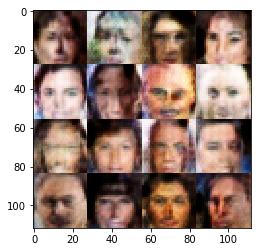

Epoch 1/1... Generator Loss: 0.6047 Discriminator Loss: 1.4371...


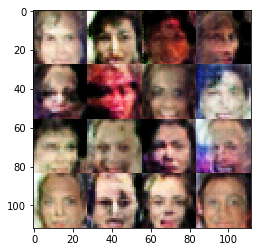

Epoch 1/1... Generator Loss: 0.5924 Discriminator Loss: 1.3525...


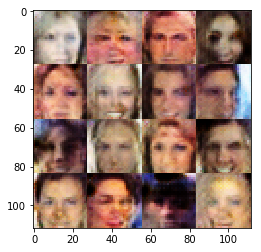

Epoch 1/1... Generator Loss: 0.7927 Discriminator Loss: 1.3753...


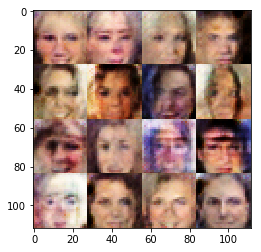

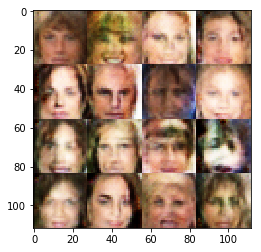

Epoch 1/1... Generator Loss: 0.7695 Discriminator Loss: 1.3392...


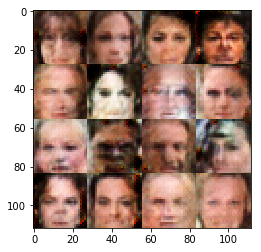

Epoch 1/1... Generator Loss: 1.0916 Discriminator Loss: 1.3528...


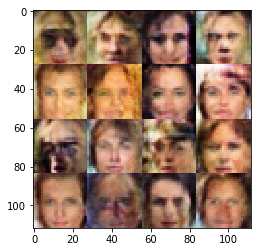

Epoch 1/1... Generator Loss: 0.8243 Discriminator Loss: 1.4146...


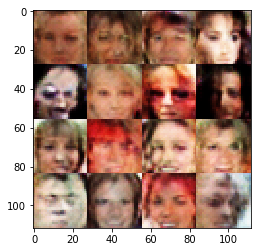

Epoch 1/1... Generator Loss: 0.8179 Discriminator Loss: 1.4032...


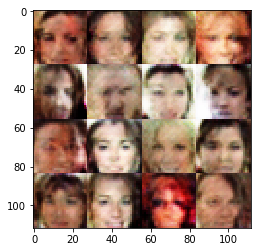

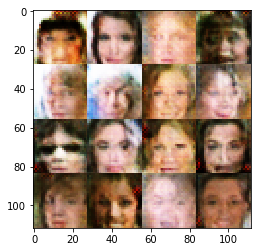

Epoch 1/1... Generator Loss: 0.8052 Discriminator Loss: 1.3210...


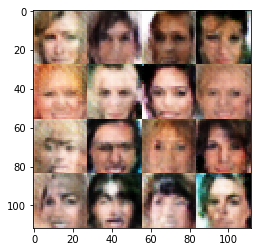

Epoch 1/1... Generator Loss: 0.6614 Discriminator Loss: 1.3752...


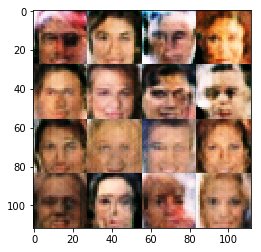

Epoch 1/1... Generator Loss: 0.6605 Discriminator Loss: 1.3510...


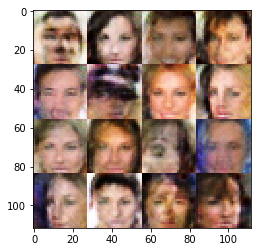

Epoch 1/1... Generator Loss: 0.6403 Discriminator Loss: 1.4686...


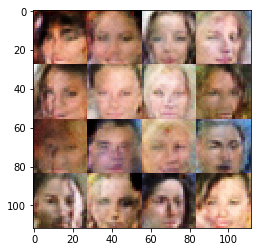

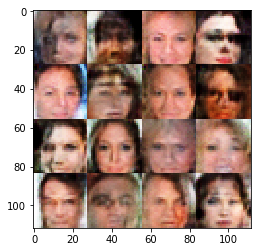

Epoch 1/1... Generator Loss: 0.6726 Discriminator Loss: 1.4044...


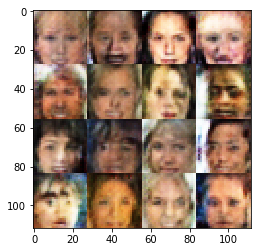

Epoch 1/1... Generator Loss: 0.7462 Discriminator Loss: 1.3818...


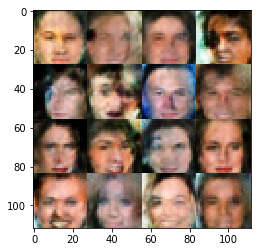

Epoch 1/1... Generator Loss: 0.8451 Discriminator Loss: 1.3562...


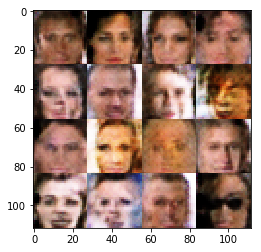

Epoch 1/1... Generator Loss: 0.3069 Discriminator Loss: 1.7622...


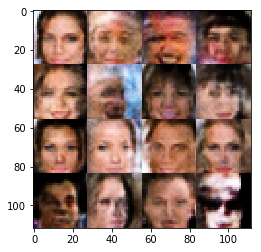

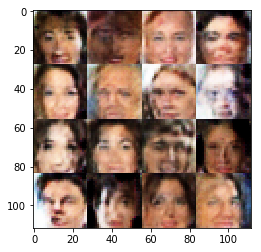

Epoch 1/1... Generator Loss: 0.7937 Discriminator Loss: 1.3883...


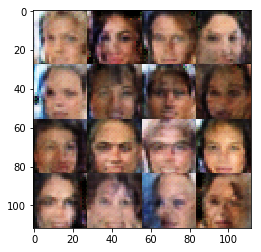

Epoch 1/1... Generator Loss: 0.7838 Discriminator Loss: 1.3944...


In [166]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.3
alpha = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.